First we need to install tensorflow with gpu support

In [ ]:
!pip install tensorflow-gpu

We need to connect to google drive to access our dataset files.

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

!ls "/content/gdrive/My Drive/DiaRestore/"

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).
img.png  imgs_np.npz	   labels_np.npz       train_hist.npy
imgs	 imgs_test_np.npz  labels_test_np.npz


The next snippet is the dataloader class. The main part is the `load_batch` function which allows us to load in arbitrarily sized batches of data to train on.

In [ ]:
import numpy as np
import cv2
import os
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
import math

import matplotlib.pyplot as plt

class DataLoader():
    def __init__(self, imgs_path, labels_path, batch_size = 4):
        self.imgs_path = imgs_path
        self.labels_path = labels_path
        self.batch_size = batch_size
        self.data, self.labels = self.pre_load_data()
        print(self.data.shape)

    def pre_load_data(self):
        imgs = np.load(self.imgs_path)['arr_0'].astype(dtype=float)
        labels = np.load(self.labels_path)['arr_0'].astype(dtype=float)
        
        return imgs, labels

    def __len__(self):
        '''
        :return:    number of total batches, depends on batch size and index
        '''
        return int(np.floor(len(self.data) / float(self.batch_size)))

    def shuffle_in_unison_scary(self, a, b):
        rng_state = np.random.get_state()
        np.random.shuffle(a)
        np.random.set_state(rng_state)
        np.random.shuffle(b)

    def rotate_image(self, image, angle):
        image_center = tuple(np.array(image.shape[1::-1]) / 2)
        rot_mat = cv2.getRotationMatrix2D(image_center, angle, 1.0)
        result = cv2.warpAffine(image, rot_mat, image.shape[1::-1], flags=cv2.INTER_LINEAR)
        return result

    def rotate_point(self, point, origin, angle):
      ox, oy = origin
      px, py = point
      qx = ox + math.cos(angle) * (px - ox) - math.sin(angle) * (py - oy)
      qy = oy + math.sin(angle) * (px - ox) + math.cos(angle) * (py - oy)
      return qx, qy

    def load_batch(self):
        self.shuffle_in_unison_scary(self.data, self.labels)
        for i in range(self.__len__()):
            batch = self.data[i * self.batch_size:(i + 1) * self.batch_size].astype(dtype=float)
            target = self.labels[i * self.batch_size:(i + 1) * self.batch_size].astype(dtype=float)

            for j in range(self.batch_size):


                # shift image a little as data augmentation
                rows, cols, c = batch[j].shape
                sav = np.random.randint(-65, 65)
                sah = np.random.randint(-65, 65)
                M = np.float32([[1, 0, sav], [0, 1, sah]])
                img = cv2.warpAffine(batch[j] , M, (cols, rows))

                angle = np.random.randint(0, 1)
                img = self.rotate_image(img, angle)

                batch[j,] = img / 255.0
 
                # also need to shift
                flat_list = np.array([target[j]])

                flat_list[0][0] = flat_list[0][0] + sav
                flat_list[0][2] = flat_list[0][2] + sav
                flat_list[0][4] = flat_list[0][4] + sav
                flat_list[0][6] = flat_list[0][6] + sav

                flat_list[0][1] = flat_list[0][1] + sah
                flat_list[0][3] = flat_list[0][3] + sah
                flat_list[0][5] = flat_list[0][5] + sah
                flat_list[0][7] = flat_list[0][7] + sah

                origin = tuple(np.array(img.shape[1::-1]) / 2)
                flat_list[0][0], flat_list[0][1] = self.rotate_point((flat_list[0][0], flat_list[0][1]), origin, math.radians(-angle))
                flat_list[0][2], flat_list[0][3] = self.rotate_point((flat_list[0][2], flat_list[0][3]), origin, math.radians(-angle))
                flat_list[0][4], flat_list[0][5] = self.rotate_point((flat_list[0][4], flat_list[0][5]), origin, math.radians(-angle))
                flat_list[0][6], flat_list[0][7] = self.rotate_point((flat_list[0][6], flat_list[0][7]), origin, math.radians(-angle))
                flat_list = flat_list[0]
                target[j,] = np.array(flat_list)

            yield batch, target

Next up we need to instantiate the DataLoader Object. We will create one for training and another one for testing:

In [ ]:
path = "/content/gdrive/My Drive/DiaRestore/"
train_loader = DataLoader(path + "imgs_np.npz", path + "labels_np.npz", batch_size = 32)
test_loader = DataLoader(path + "imgs_test_np.npz", path + "labels_test_np.npz", batch_size = 1)
eval_loader = DataLoader(path + "imgs_test_np.npz", path + "labels_test_np.npz", batch_size = 1)

(561, 504, 378, 3)
(10, 504, 378, 3)
(10, 504, 378, 3)


[147. 198. 255. 201. 251. 358. 147. 355.]
(378, 504)
[147.0, 198.0, 255.0, 201.0, 251.0, 358.0, 147.0, 355.0]


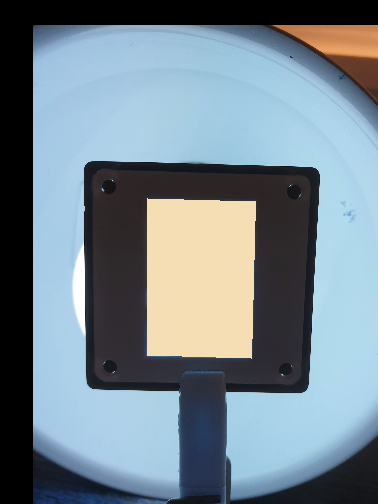

In [ ]:
import matplotlib
from matplotlib import cm
from matplotlib.patches import Polygon
from matplotlib.collections import PatchCollection
import PIL.ImageDraw as ImageDraw
import PIL.Image as Image

for j, (imgs, labels) in enumerate(train_loader.load_batch()):
    labels = labels[0]
    #labels = [labels[i:i + 2] for i in range(0, len(labels), 2)]
    print(labels)
    
    img = Image.fromarray(np.uint8(imgs[0]*255))
    print(img.size)
    draw = ImageDraw.Draw(img)

    # points = ((1,1), (2,1), (2,2), (1,2), (0.5,1.5))
    print(np.array(labels).flatten().tolist())
    draw.polygon(np.array(labels).flatten().tolist(), fill = "wheat")

    display(img)

    break

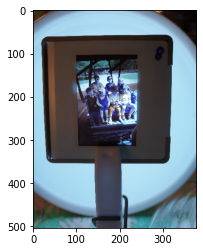

In [ ]:
# test the archive
imgs = np.load(path + "imgs_np.npz")
import matplotlib.pyplot as plt
plt.imshow(imgs['arr_0'][0])

Now we need to create our model.

In [ ]:
import keras
from keras.models import Model
from keras.layers import Input, Conv2D, Dense, Flatten

In [ ]:
net_in = Input(shape=(504,378,3))
conv1 = Conv2D(16,7, activation="relu")(net_in)
conv12 = Conv2D(16,7, strides=(2,2), activation="relu")(conv1)


conv2 = Conv2D(48,3, activation="relu")(conv12)
conv22 = Conv2D(48,3, strides=(2,2), activation="relu")(conv2)


conv3 = Conv2D(64,3, activation="relu")(conv22)
conv32 = Conv2D(64,3, strides=(2,2), activation="relu")(conv3)


conv4 = Conv2D(96,3, strides = (2,2), activation="relu")(conv32)
conv42 = Conv2D(128,3, strides=(2,2), activation="relu")(conv4)

flat = Flatten()(conv42)
dense = Dense(8)(flat)

model = Model(net_in, dense)
model.summary()

Model: "functional_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 504, 378, 3)]     0         
_________________________________________________________________
conv2d (Conv2D)              (None, 498, 372, 16)      2368      
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 246, 183, 16)      12560     
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 244, 181, 48)      6960      
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 121, 90, 48)       20784     
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 119, 88, 64)       27712     
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 59, 43, 64)       

Next we should choose an optimizer and compile the model:

In [ ]:

import keras.backend as K
def root_mean_squared_error(y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

from keras.optimizers import Adam

model.compile(optimizer=Adam(lr = 0.002), loss=root_mean_squared_error, loss_weights = [1], metrics=["accuracy"])


And finally we can define the training loop

Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.
Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.
INFO:tensorflow:Assets written to: /content/gdrive/My Drive/DiaRestore/model_0/assets


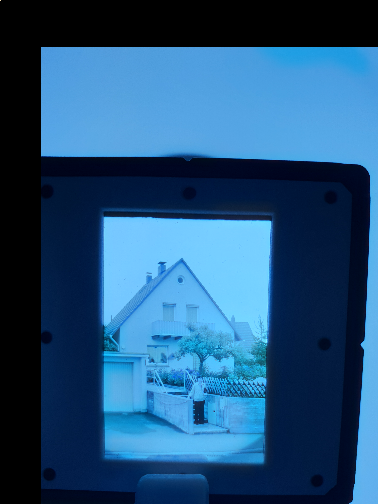

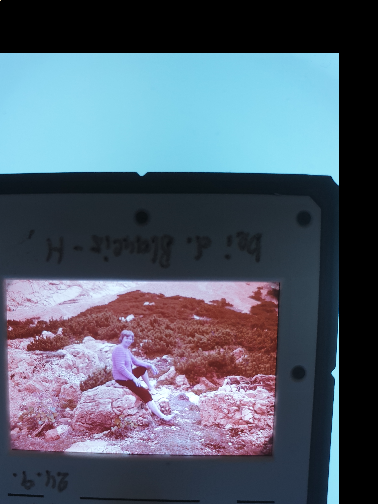

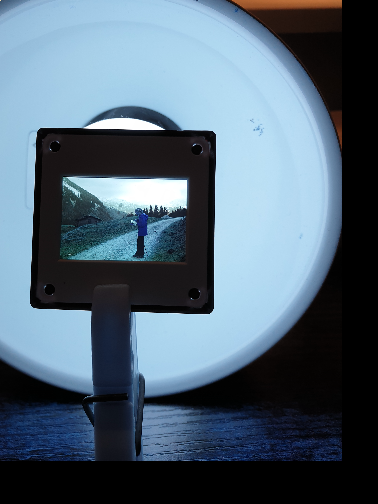

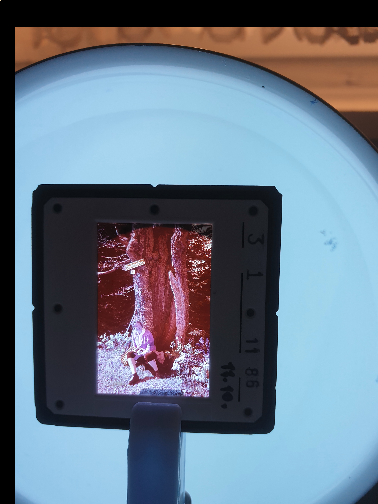

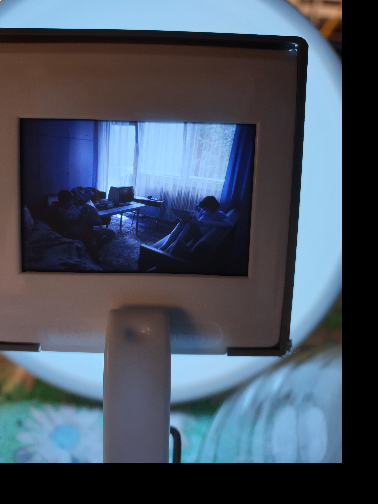

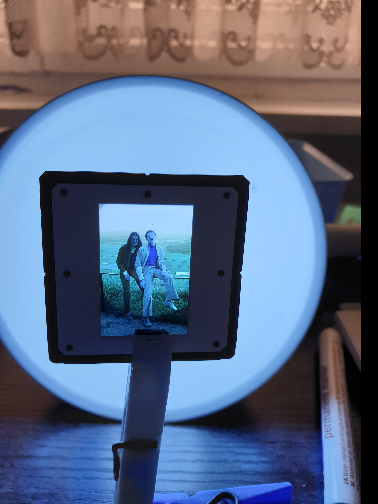

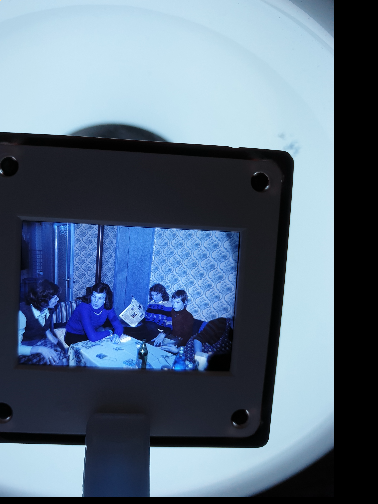

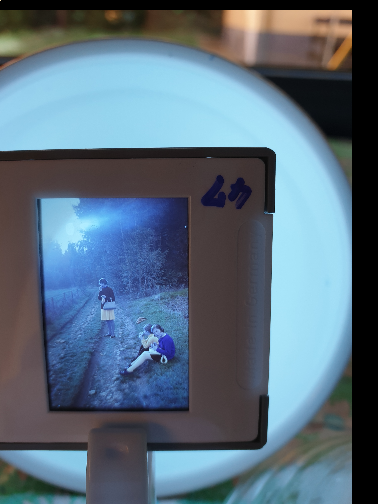

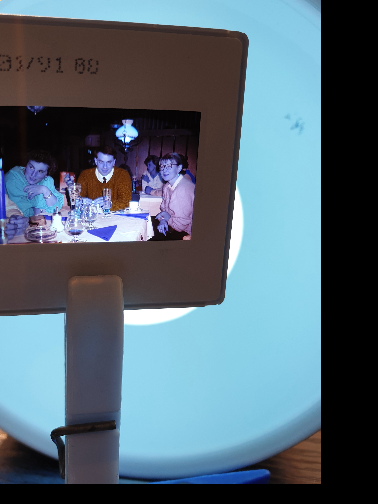

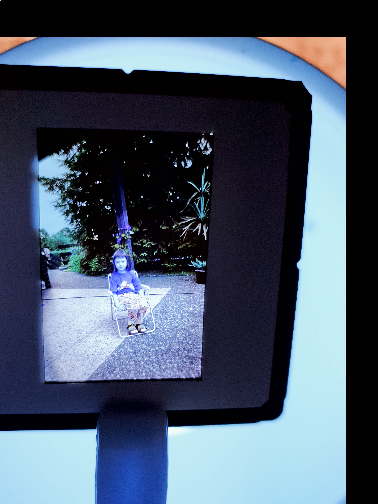

[E: 0/1000][B: 0/17][Loss: [232.9278106689453, 0.0625]]
[E: 0/1000][B: 1/17][Loss: [235.59268188476562, 0.09375]]
[E: 0/1000][B: 2/17][Loss: [199.51046752929688, 0.1875]]
[E: 0/1000][B: 3/17][Loss: [294.1917419433594, 0.1875]]
[E: 0/1000][B: 4/17][Loss: [165.17733764648438, 0.8125]]
[E: 0/1000][B: 5/17][Loss: [212.7689971923828, 0.6875]]
[E: 0/1000][B: 6/17][Loss: [226.5784912109375, 0.40625]]
[E: 0/1000][B: 7/17][Loss: [227.57106018066406, 0.25]]
[E: 0/1000][B: 8/17][Loss: [236.49282836914062, 0.1875]]
[E: 0/1000][B: 9/17][Loss: [225.84169006347656, 0.15625]]
[E: 0/1000][B: 10/17][Loss: [239.46066284179688, 0.09375]]
[E: 0/1000][B: 11/17][Loss: [225.74391174316406, 0.1875]]
[E: 0/1000][B: 12/17][Loss: [224.603759765625, 0.125]]
[E: 0/1000][B: 13/17][Loss: [217.6085662841797, 0.0625]]
[E: 0/1000][B: 14/17][Loss: [205.4591827392578, 0.1875]]
[E: 0/1000][B: 15/17][Loss: [200.081787109375, 0.03125]]
[E: 0/1000][B: 16/17][Loss: [175.29408264160156, 0.09375]]
[E: 1/1000][B: 0/17][Loss: [112

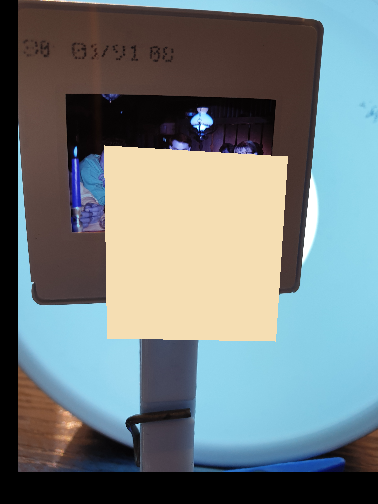

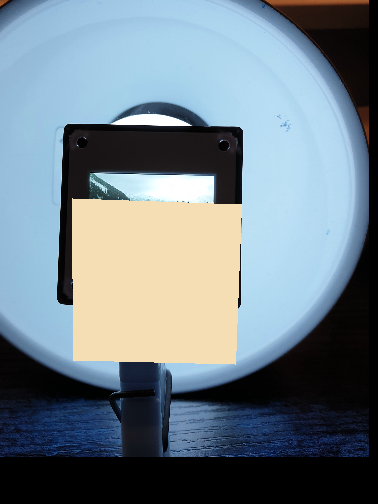

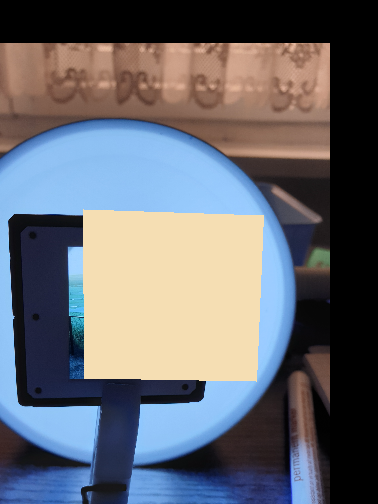

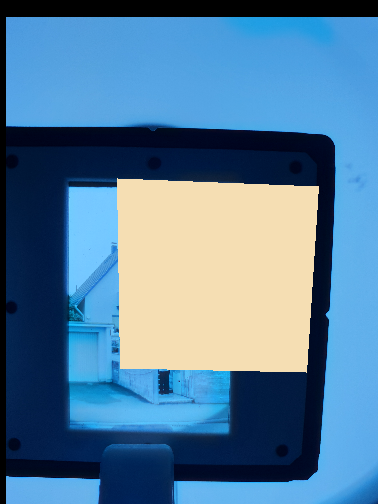

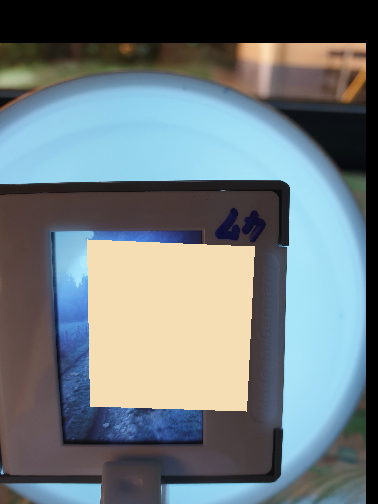

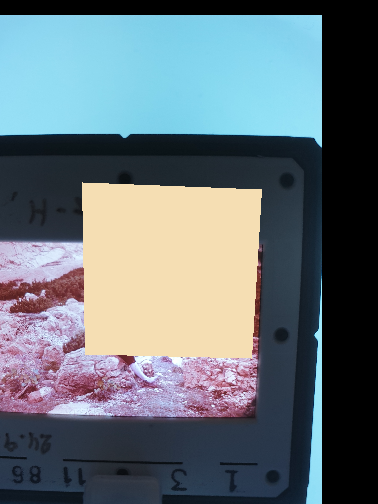

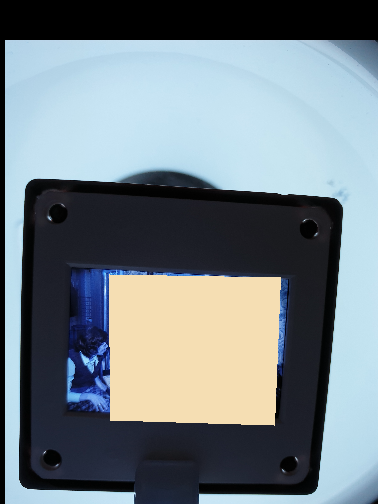

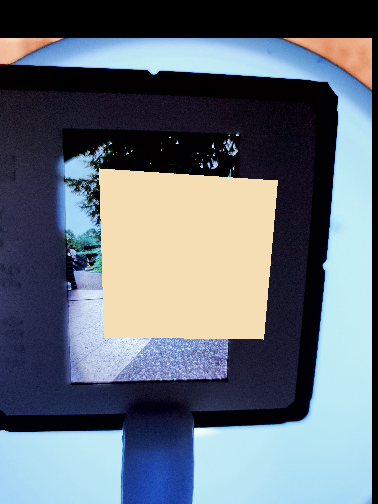

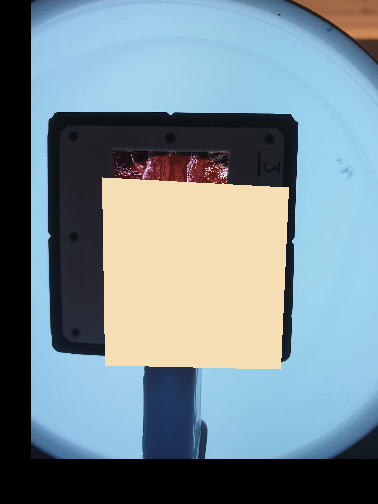

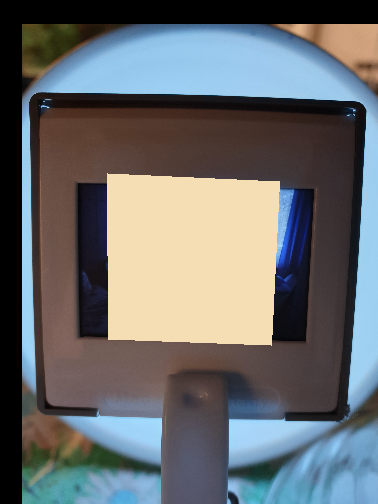

[E: 5/1000][B: 0/17][Loss: [58.70071792602539, 0.75]]
[E: 5/1000][B: 1/17][Loss: [49.747989654541016, 0.6875]]
[E: 5/1000][B: 2/17][Loss: [46.42235565185547, 0.65625]]
[E: 5/1000][B: 3/17][Loss: [57.81993103027344, 0.75]]
[E: 5/1000][B: 4/17][Loss: [58.956485748291016, 0.6875]]
[E: 5/1000][B: 5/17][Loss: [50.71723556518555, 0.90625]]
[E: 5/1000][B: 6/17][Loss: [51.59498596191406, 0.6875]]
[E: 5/1000][B: 7/17][Loss: [44.531715393066406, 0.6875]]
[E: 5/1000][B: 8/17][Loss: [43.06046676635742, 0.65625]]
[E: 5/1000][B: 9/17][Loss: [56.81752014160156, 0.71875]]
[E: 5/1000][B: 10/17][Loss: [40.64496612548828, 0.875]]
[E: 5/1000][B: 11/17][Loss: [57.61185836791992, 0.71875]]
[E: 5/1000][B: 12/17][Loss: [40.62519836425781, 0.8125]]
[E: 5/1000][B: 13/17][Loss: [46.198333740234375, 0.84375]]
[E: 5/1000][B: 14/17][Loss: [54.908966064453125, 0.78125]]
[E: 5/1000][B: 15/17][Loss: [45.71821212768555, 0.75]]
[E: 5/1000][B: 16/17][Loss: [46.33479690551758, 0.75]]
[E: 6/1000][B: 0/17][Loss: [38.3915824

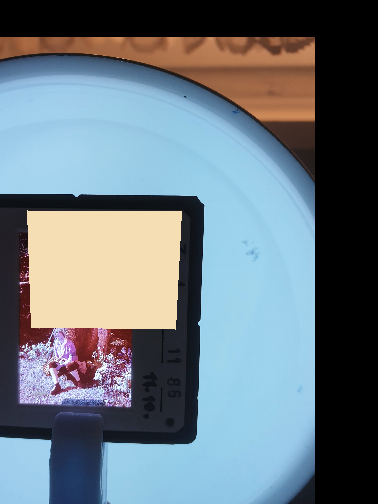

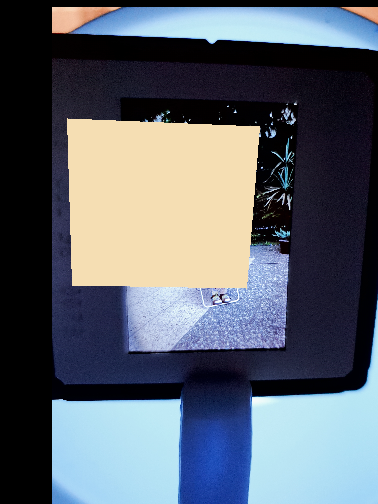

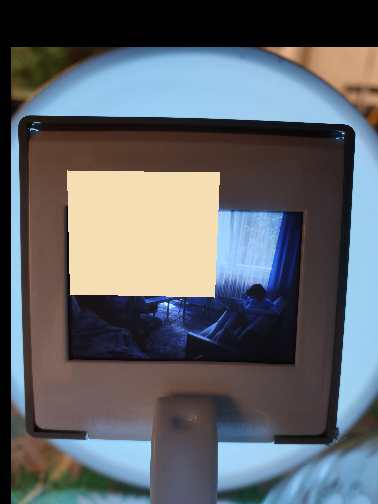

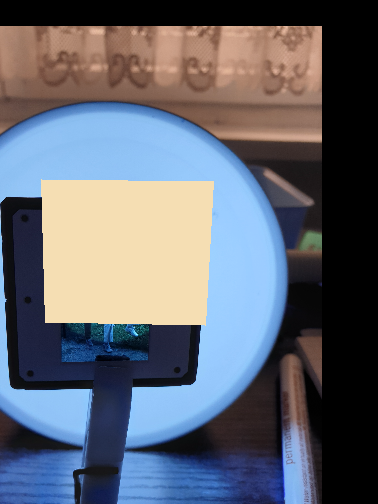

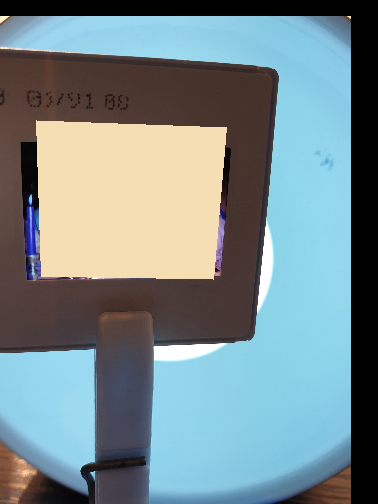

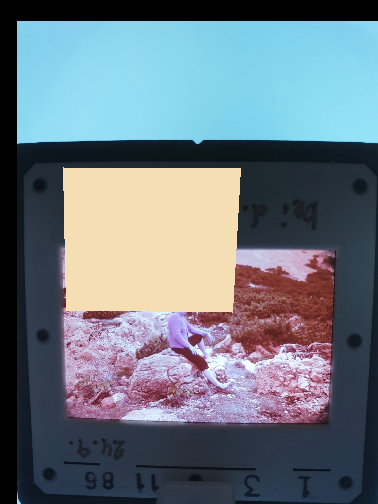

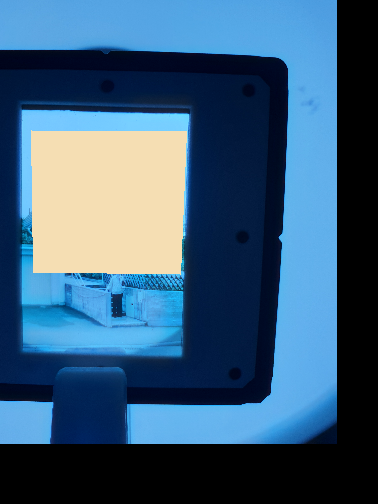

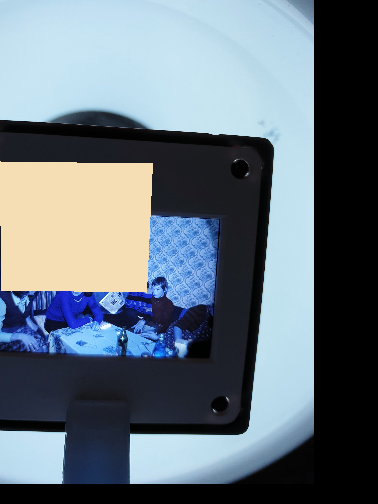

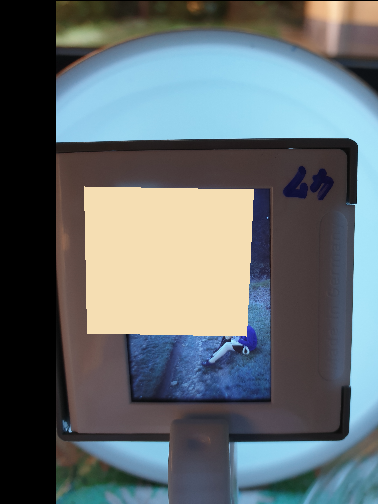

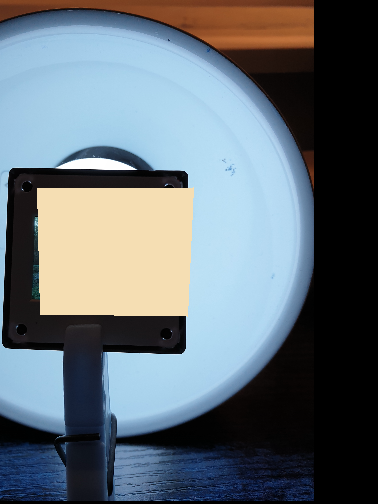

[E: 10/1000][B: 0/17][Loss: [40.021690368652344, 0.84375]]
[E: 10/1000][B: 1/17][Loss: [40.32231140136719, 0.75]]
[E: 10/1000][B: 2/17][Loss: [48.264163970947266, 0.6875]]
[E: 10/1000][B: 3/17][Loss: [42.818241119384766, 0.8125]]
[E: 10/1000][B: 4/17][Loss: [47.21071243286133, 0.75]]
[E: 10/1000][B: 5/17][Loss: [42.53401184082031, 0.65625]]
[E: 10/1000][B: 6/17][Loss: [36.381996154785156, 0.75]]
[E: 10/1000][B: 7/17][Loss: [35.75299835205078, 0.8125]]
[E: 10/1000][B: 8/17][Loss: [40.79427719116211, 0.75]]
[E: 10/1000][B: 9/17][Loss: [41.987144470214844, 0.71875]]
[E: 10/1000][B: 10/17][Loss: [41.212928771972656, 0.875]]
[E: 10/1000][B: 11/17][Loss: [47.06166076660156, 0.71875]]
[E: 10/1000][B: 12/17][Loss: [35.00414276123047, 0.75]]
[E: 10/1000][B: 13/17][Loss: [34.45779800415039, 0.6875]]
[E: 10/1000][B: 14/17][Loss: [34.592689514160156, 0.71875]]
[E: 10/1000][B: 15/17][Loss: [38.91796875, 0.75]]
[E: 10/1000][B: 16/17][Loss: [34.52130889892578, 0.75]]
[E: 11/1000][B: 0/17][Loss: [34.8

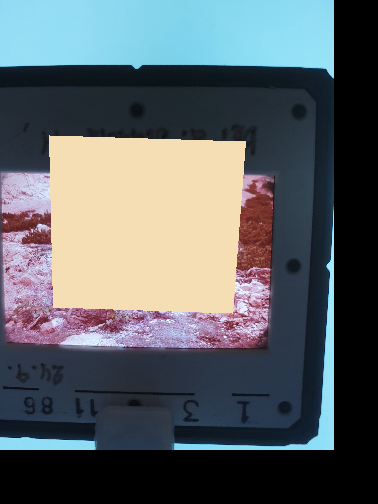

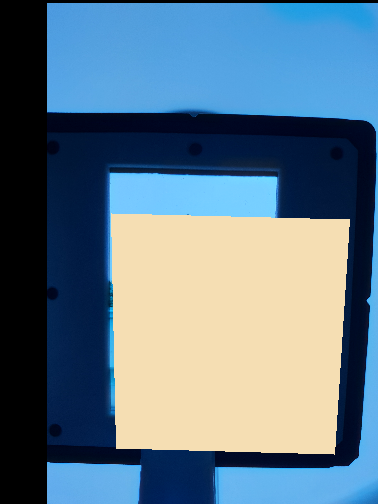

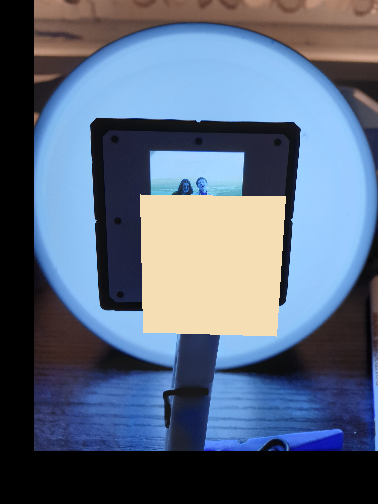

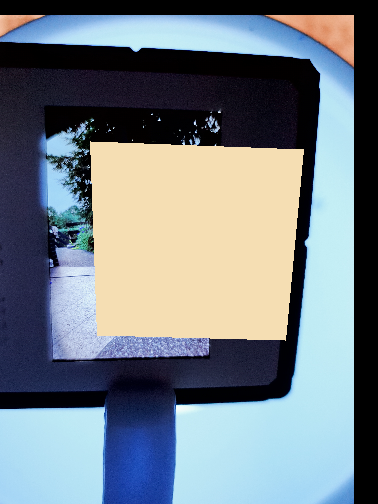

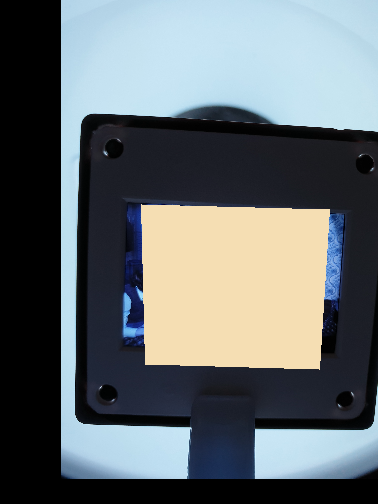

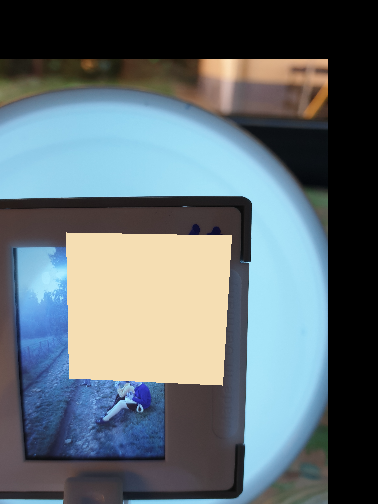

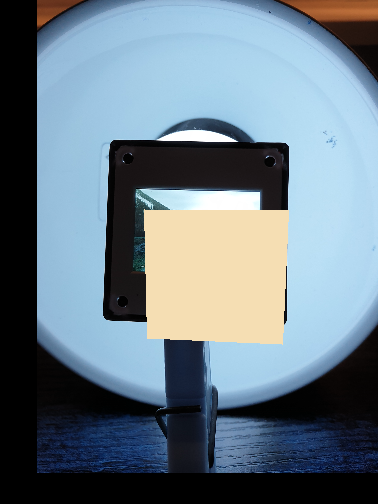

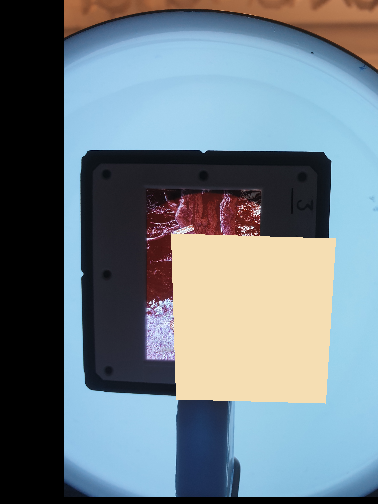

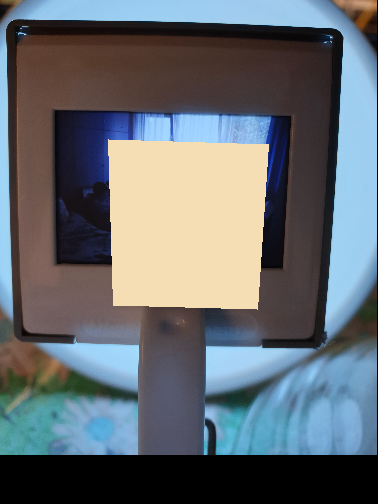

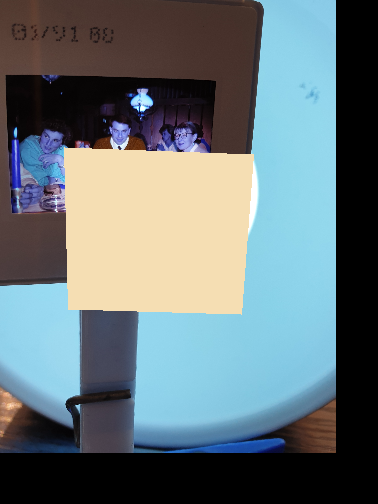

[E: 15/1000][B: 0/17][Loss: [37.63719177246094, 0.875]]
[E: 15/1000][B: 1/17][Loss: [33.21501159667969, 0.8125]]
[E: 15/1000][B: 2/17][Loss: [34.59987258911133, 0.65625]]
[E: 15/1000][B: 3/17][Loss: [39.01838302612305, 0.8125]]
[E: 15/1000][B: 4/17][Loss: [30.35659408569336, 0.78125]]
[E: 15/1000][B: 5/17][Loss: [50.43771743774414, 0.71875]]
[E: 15/1000][B: 6/17][Loss: [28.71715545654297, 0.75]]
[E: 15/1000][B: 7/17][Loss: [43.89768981933594, 0.78125]]
[E: 15/1000][B: 8/17][Loss: [31.692590713500977, 0.65625]]
[E: 15/1000][B: 9/17][Loss: [39.45703125, 0.71875]]
[E: 15/1000][B: 10/17][Loss: [39.675167083740234, 0.8125]]
[E: 15/1000][B: 11/17][Loss: [34.269256591796875, 0.75]]
[E: 15/1000][B: 12/17][Loss: [36.05194091796875, 0.8125]]
[E: 15/1000][B: 13/17][Loss: [41.654335021972656, 0.84375]]
[E: 15/1000][B: 14/17][Loss: [33.40073013305664, 0.8125]]
[E: 15/1000][B: 15/17][Loss: [34.04941940307617, 0.8125]]
[E: 15/1000][B: 16/17][Loss: [42.230247497558594, 0.75]]
[E: 16/1000][B: 0/17][Los

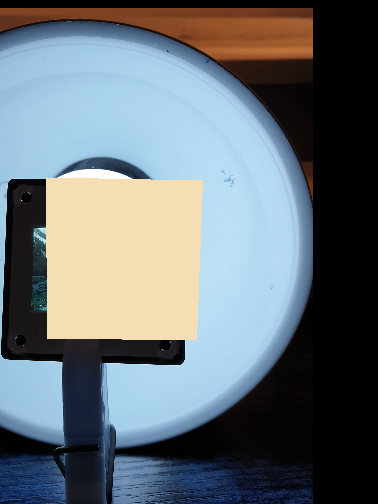

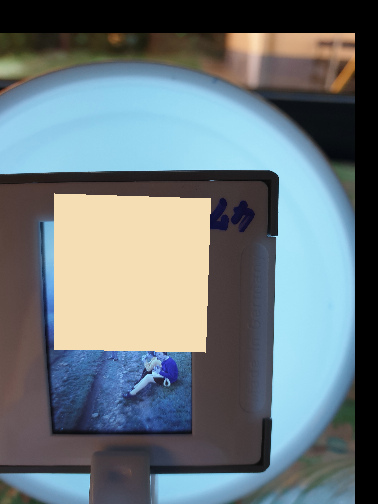

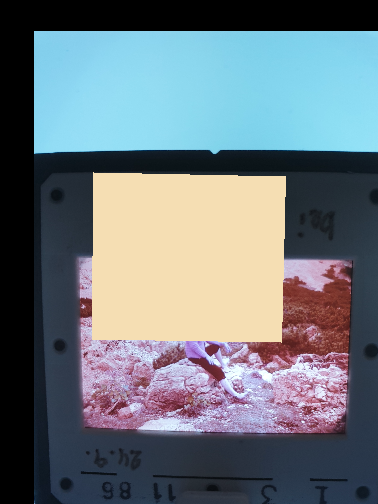

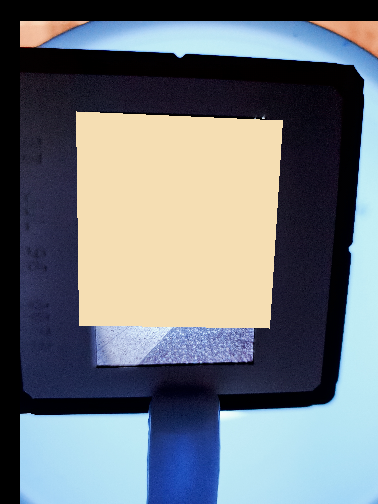

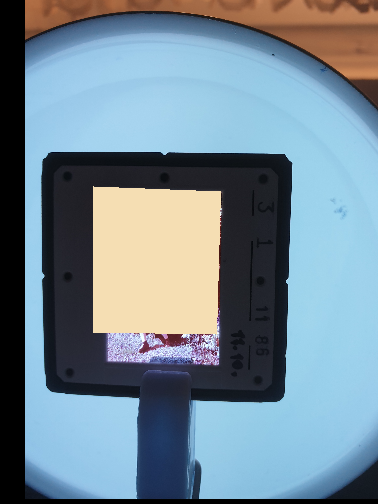

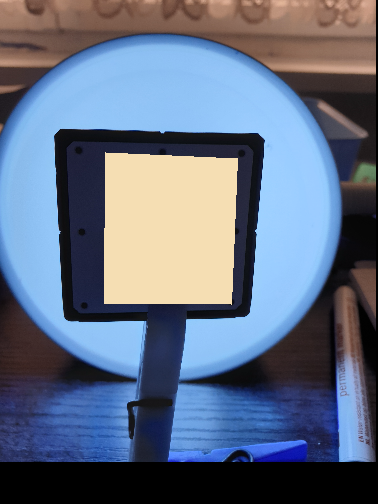

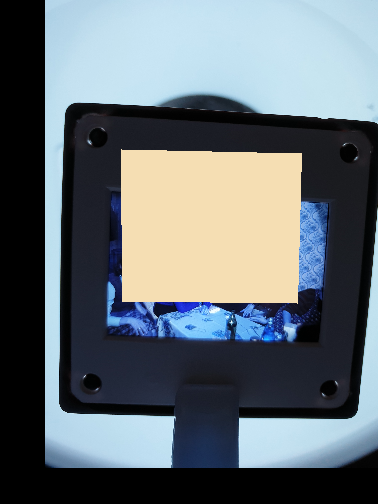

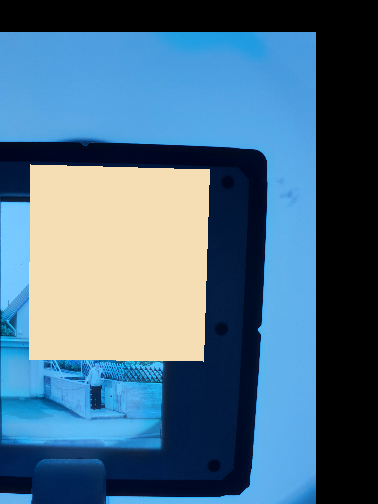

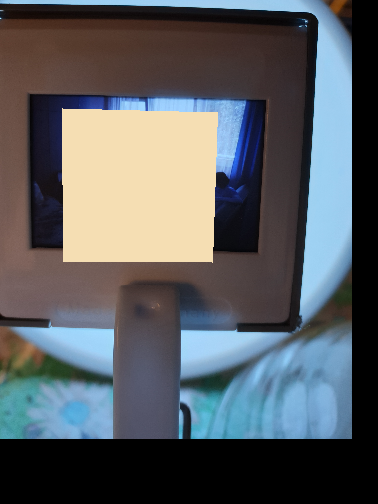

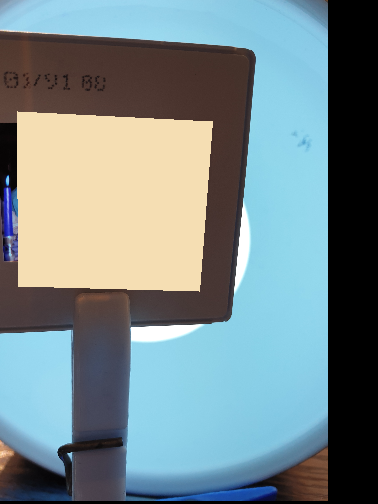

[E: 20/1000][B: 0/17][Loss: [26.94872283935547, 0.8125]]
[E: 20/1000][B: 1/17][Loss: [35.90187454223633, 0.8125]]
[E: 20/1000][B: 2/17][Loss: [30.02998161315918, 0.6875]]
[E: 20/1000][B: 3/17][Loss: [29.56401824951172, 0.78125]]
[E: 20/1000][B: 4/17][Loss: [40.507164001464844, 0.71875]]
[E: 20/1000][B: 5/17][Loss: [34.69938659667969, 0.6875]]
[E: 20/1000][B: 6/17][Loss: [37.806915283203125, 0.8125]]
[E: 20/1000][B: 7/17][Loss: [33.25575637817383, 0.59375]]
[E: 20/1000][B: 8/17][Loss: [28.4492244720459, 0.8125]]
[E: 20/1000][B: 9/17][Loss: [32.820621490478516, 0.8125]]
[E: 20/1000][B: 10/17][Loss: [28.46177101135254, 0.75]]
[E: 20/1000][B: 11/17][Loss: [29.472881317138672, 0.78125]]
[E: 20/1000][B: 12/17][Loss: [31.798397064208984, 0.71875]]
[E: 20/1000][B: 13/17][Loss: [33.37284851074219, 0.75]]
[E: 20/1000][B: 14/17][Loss: [25.851293563842773, 0.875]]
[E: 20/1000][B: 15/17][Loss: [35.2261848449707, 0.6875]]
[E: 20/1000][B: 16/17][Loss: [29.49300193786621, 0.84375]]
[E: 21/1000][B: 0/1

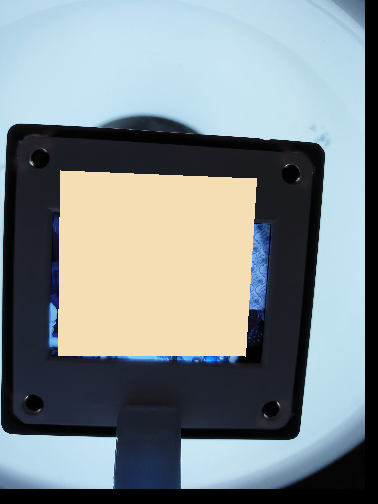

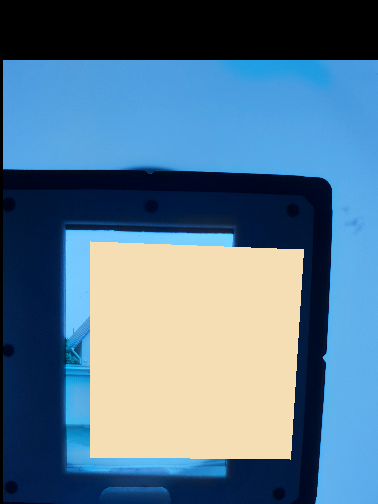

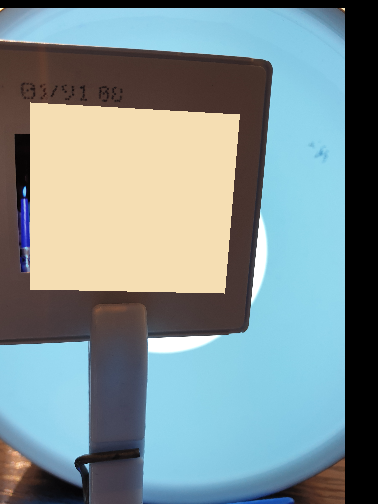

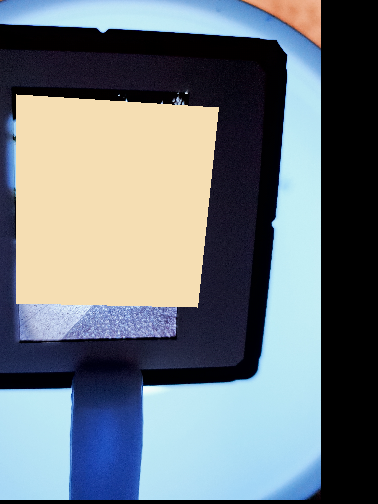

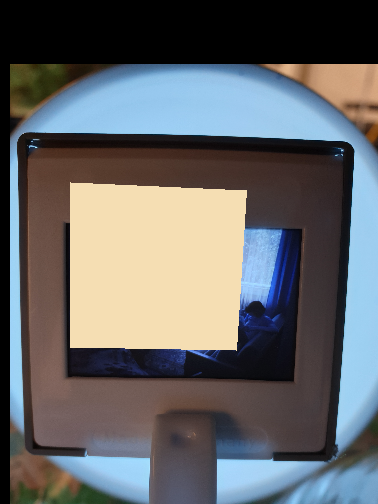

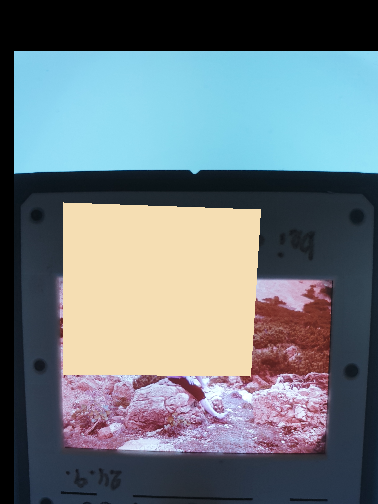

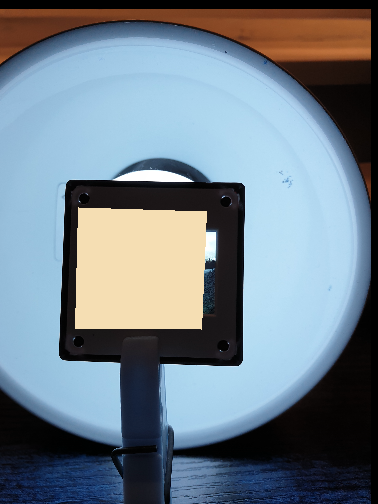

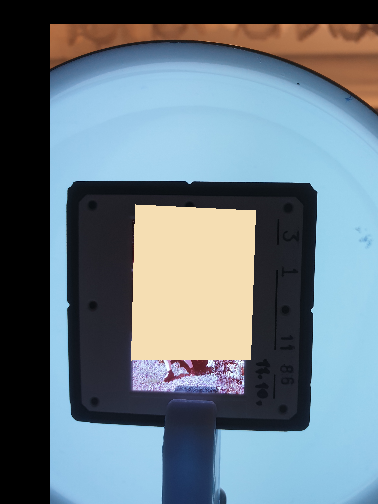

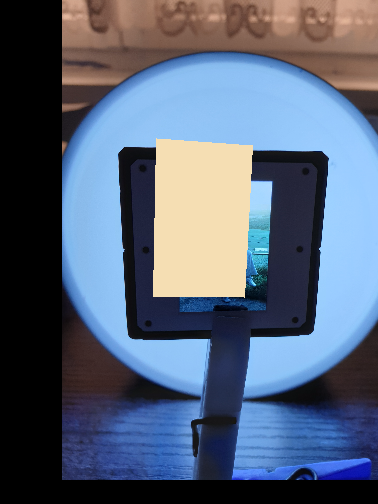

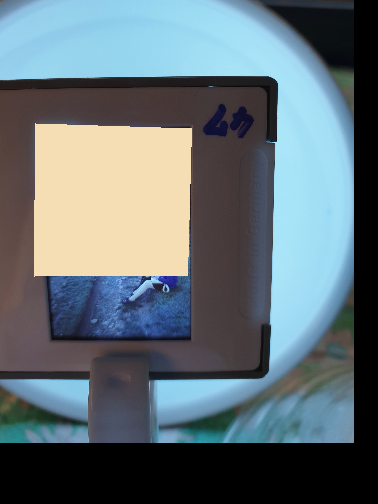

[E: 25/1000][B: 0/17][Loss: [29.198583602905273, 0.84375]]
[E: 25/1000][B: 1/17][Loss: [23.540645599365234, 0.6875]]
[E: 25/1000][B: 2/17][Loss: [33.52394485473633, 0.75]]
[E: 25/1000][B: 3/17][Loss: [30.53502655029297, 0.8125]]
[E: 25/1000][B: 4/17][Loss: [26.477750778198242, 0.8125]]
[E: 25/1000][B: 5/17][Loss: [24.01347541809082, 0.90625]]
[E: 25/1000][B: 6/17][Loss: [35.842750549316406, 0.75]]
[E: 25/1000][B: 7/17][Loss: [31.397228240966797, 0.78125]]
[E: 25/1000][B: 8/17][Loss: [25.705474853515625, 0.78125]]
[E: 25/1000][B: 9/17][Loss: [23.520612716674805, 0.71875]]
[E: 25/1000][B: 10/17][Loss: [43.031856536865234, 0.84375]]
[E: 25/1000][B: 11/17][Loss: [29.136693954467773, 0.75]]
[E: 25/1000][B: 12/17][Loss: [51.98112869262695, 0.65625]]
[E: 25/1000][B: 13/17][Loss: [23.293468475341797, 0.8125]]
[E: 25/1000][B: 14/17][Loss: [38.43704605102539, 0.90625]]
[E: 25/1000][B: 15/17][Loss: [30.7331600189209, 0.84375]]
[E: 25/1000][B: 16/17][Loss: [50.58482360839844, 0.59375]]
[E: 26/1000

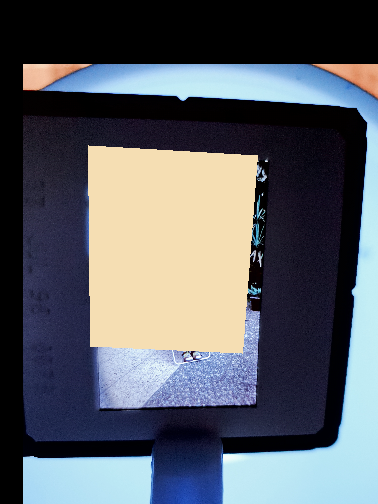

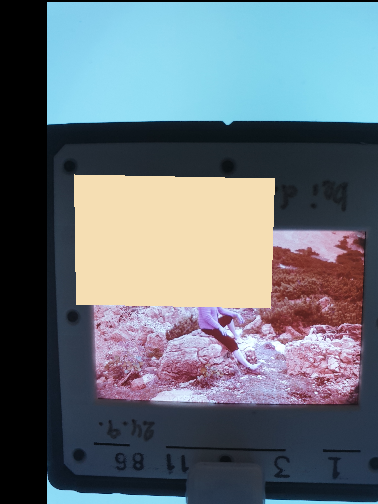

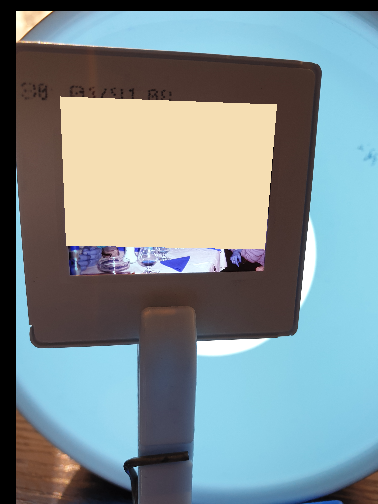

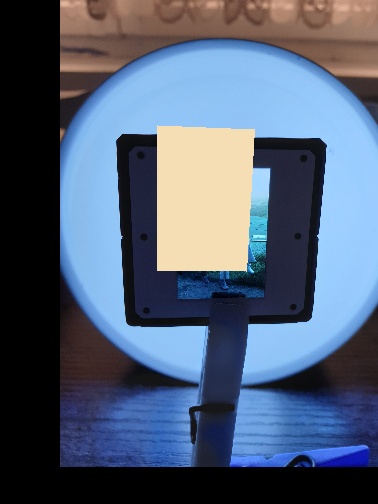

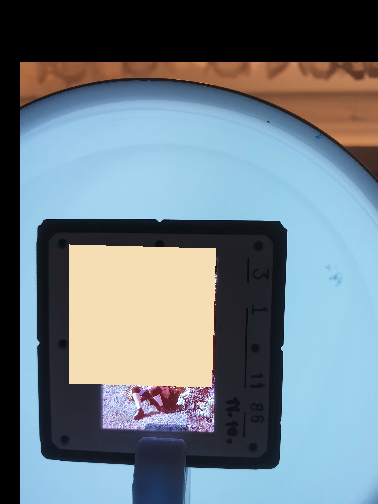

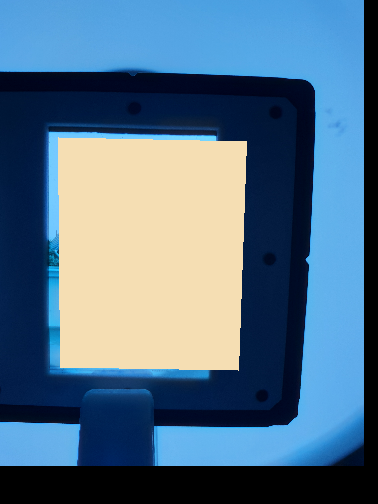

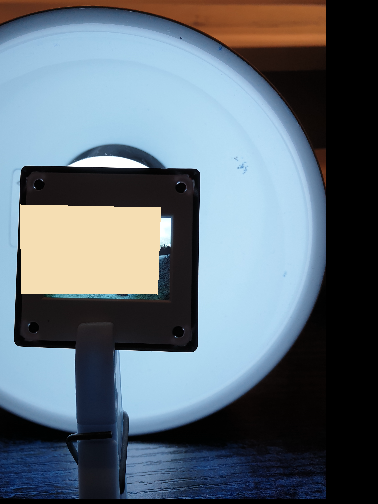

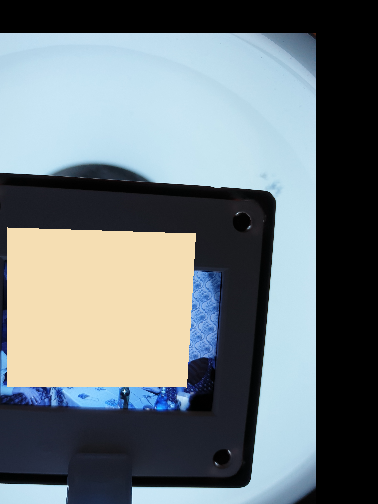

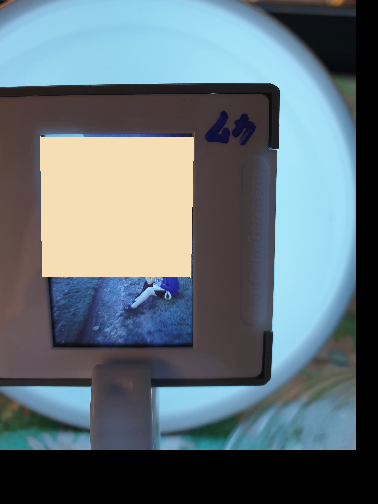

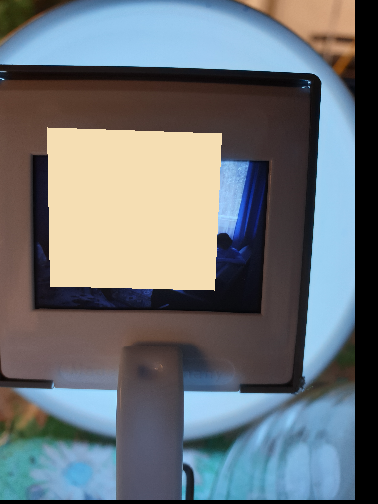

[E: 30/1000][B: 0/17][Loss: [39.863250732421875, 0.75]]
[E: 30/1000][B: 1/17][Loss: [27.291982650756836, 0.84375]]
[E: 30/1000][B: 2/17][Loss: [31.034208297729492, 0.71875]]
[E: 30/1000][B: 3/17][Loss: [32.47716522216797, 0.8125]]
[E: 30/1000][B: 4/17][Loss: [37.193180084228516, 0.8125]]
[E: 30/1000][B: 5/17][Loss: [27.52898597717285, 0.875]]
[E: 30/1000][B: 6/17][Loss: [21.656009674072266, 0.78125]]
[E: 30/1000][B: 7/17][Loss: [29.025110244750977, 0.8125]]
[E: 30/1000][B: 8/17][Loss: [23.678146362304688, 0.8125]]
[E: 30/1000][B: 9/17][Loss: [23.602216720581055, 0.90625]]
[E: 30/1000][B: 10/17][Loss: [22.815771102905273, 0.875]]
[E: 30/1000][B: 11/17][Loss: [22.315431594848633, 0.8125]]
[E: 30/1000][B: 12/17][Loss: [20.73059844970703, 0.78125]]
[E: 30/1000][B: 13/17][Loss: [27.383941650390625, 0.78125]]
[E: 30/1000][B: 14/17][Loss: [24.497570037841797, 0.78125]]
[E: 30/1000][B: 15/17][Loss: [26.438522338867188, 0.53125]]
[E: 30/1000][B: 16/17][Loss: [23.356287002563477, 0.75]]
[E: 31/1

In [ ]:
train_loss_hist = []
eval_loss_hist = []
plt.ylim(top = 250)
epochs = 1000
for e in range(epochs):
    #plt.plot(train_loss_hist)
    #plt.plot(eval_loss_hist)
    #plt.show()
    #plt.close('all')

    if e % 5 == 0:
      model.save("/content/gdrive/My Drive/DiaRestore/model_{}".format(e))
      np.save("/content/gdrive/My Drive/DiaRestore/train_hist.npy",train_loss_hist)
      np.save("/content/gdrive/My Drive/DiaRestoreeval_hist.npy",eval_loss_hist)
      
    if e % 5 == 0:
        for k, (test_imgs, test_labels) in enumerate(test_loader.load_batch()):
            prediction = model.predict(test_imgs)
            to_show = test_imgs[0] * 255

            prediction = prediction[0]
            img = Image.fromarray(np.uint8(test_imgs[0]*255))

            draw = ImageDraw.Draw(img)
            draw.polygon(np.array(prediction).flatten().tolist(), fill = "wheat")

            display(img)
            
            
            #cv2.imwrite("/content/gdrive/My Drive/DiaRestore/imgs/img_{}_{}.png".format(e, k), to_show)
            
    for j, (eval_img, eval_label) in enumerate(eval_loader.load_batch()):
        eval_loss = model.test_on_batch(eval_img, eval_label)
        eval_loss_hist.append(eval_loss[0])
        #print("[E: {}/{}][B: {}/{}][Loss: {}]".format(e, epochs, j, len(train_loader), loss))

    for j, (imgs, labels) in enumerate(train_loader.load_batch()):
        train_loss = model.train_on_batch(imgs, labels)
        train_loss_hist.append(train_loss[0])
        
        
        print("[E: {}/{}][B: {}/{}][Loss: {}]".format(e, epochs, j, len(train_loader), train_loss))

